# Fit the spectrum of CTIO Data in January 2017
==================================================================================================

- author : Sylvie Dagoret-Campagne
- affiliation : LAL/IN2P3/CNRS France
- date   : January 19th 2017
- update : January 25 2017

The goal is to calibrate in wavelength the X axis.
For this the raw spectra in the dat are read as well as the spectra simulated.
The simulated may have been checked by View_SimSpectrum_XX.ipynb

In [3]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [4]:
print theNotebook

Fit_Spectrum_HD60753


In [5]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os

In [6]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.0.1


In [7]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal

In [8]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.0.0


In [9]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [10]:
%load_ext Cython

In [11]:
from IPython.display import Image, display

In [12]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [13]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (4, 4),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [14]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

## Choose the Fit order

In [15]:
FIT_ORDER=2

## Output directory for images generated in the notebook view (not true fits images)

In [16]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images

In [17]:
ensure_dir(dir_top_images) # create that directory

### Input fits file

- Left and Right spectra in the data

In [18]:
inputdir="./spectrum_fitsspec"
object_name='HD60753'

### Output fits file

In [19]:
outputdir="./spectrum_calibspec"

In [20]:
ensure_dir(outputdir)

In [21]:
#simspecdir='/Users/dagoret-campagnesylvie/MacOsX/LSST/MyWork/GitHub/CTIOAna2016/simu_spectra/fits/HD14943_m10'
simspecdir='/Users/dagoret-campagnesylvie/MacOsX/LSST/MyWork/GitHub/CTIOAna2017/simu_spectra/fits/HD60753/2017_01_17/210_293'

### Input of fits

In [22]:
simspectrasummary='AllSimSpectra_'+object_name+'.fits'

### Results of fits

In [23]:
simspectracalibresult='SpecCalibFitResults_'+object_name +'.fits'

## Location of corrected images
----------------------------------

In [24]:
input_filelist=os.listdir(inputdir) 

In [25]:
if '.DS_Store' in input_filelist:
    input_filelist.remove('.DS_Store')
input_filelist=np.array(input_filelist)

In [26]:
print input_filelist[0:5]

['finalSpectra_HD60753_20170117_210.fits'
 'finalSpectra_HD60753_20170117_211.fits'
 'finalSpectra_HD60753_20170117_212.fits'
 'finalSpectra_HD60753_20170117_213.fits'
 'finalSpectra_HD60753_20170117_214.fits']


In [27]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list

In [28]:
#%%cython

import numpy as np
import re

def MakeFileList(inputdir,input_filelist):
    """
    MakeFileList : Make The List of files to open
    =============
    """
    
#    import numpy as np
#    import re
    indexes_files= [] # global list
    filelist_fitsimages= []  # global list
    index=0


    for file in input_filelist: # loop on directories, one per image       
            filename=inputdir+'/'+file
            if re.search('.*fits$',filename):  #example of filename filter
                num_str=re.findall('^finalSpectra_HD60753_20170117_([0-9]+).fits',file)[0]
                index=int(num_str)
                filelist_fitsimages.append(filename)
                indexes_files.append(index)
    return indexes_files, filelist_fitsimages    
    

In [29]:
indexes_files, filelist_fitsimages=MakeFileList(inputdir,input_filelist)   # filter to select fits file only

In [30]:
# transform into numpy arrays
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [31]:
print indexes_files

[210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227
 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245
 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263
 264 265 266 267 268 269 270 271 272 273 274 275 276 277 278 279 280 281
 282 283 284 285 286 287 288 289 290 291 292 293]


In [32]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [33]:
sorted_numbers=indexes_files[sorted_indexes]

In [34]:
print sorted_indexes

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49
 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74
 75 76 77 78 79 80 81 82 83]


In [35]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

In [36]:
#sorted_files

## Build full filename
----------------------------

In [37]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(inputdir,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [38]:
#sorted_filenames=np.array(sorted_filenames)
sorted_filenames=np.copy(sorted_files)

In [39]:
print sorted_filenames.shape

(84,)


## Acces to spectrum data
----------------------------------

In [40]:
all_dates = []
all_airmass = []
all_spectra = []
all_titles = []
all_header = []
all_img = []

In [41]:
%%cython

import numpy as np
from astropy.io import fits

def BuildRawSpec(sorted_filenames,sorted_numbers,object_name):
    """
    BuildRawSpec
    ===============
    """

    all_dates = []
    all_airmass = []
    all_leftspectra = []
    all_rightspectra = []
    all_titles = []
    all_header = []
    all_expo = []
   
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        header=hdu_list[0].header
        #print header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        expo = header['EXPTIME']
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        
        # now reads the spectra
        
        table_data=hdu_list[1].data
        
        left_spectrum=table_data.field('RawLeftSpec')
        right_spectrum=table_data.field('RawRightSpec')
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        all_leftspectra.append(left_spectrum)
        all_rightspectra.append(right_spectrum)
        all_titles.append(title)
        all_header.append(header)
        all_expo.append(expo)
        hdu_list.close()
        
    return all_dates,all_airmass,all_titles,all_header,all_expo,all_leftspectra,all_rightspectra

In [42]:
all_dates,all_airmass,all_titles,all_header,all_expo,all_leftspectra,all_rightspectra=BuildRawSpec(sorted_files,sorted_numbers,object_name)

## Show Spectra
-----------------------

In [43]:
len(all_rightspectra)

84

In [44]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os


def ShowSpectra(all_spectra,all_titles,object_name,dir_top_images,figname):
    """
    ShowSpectra: 
    ==============
    """
    NBIMAGES=len(all_spectra)
    MAXIMGROW=int(NBIMAGES/5)+1
    thex0 = []
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(25,60))
    f.tight_layout()
    #plt.subplot_tool() 
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        spectrum=all_spectra[index]
        axarr[iy,ix].plot(spectrum,'r-',lw=2)
        axarr[iy,ix].set_title(all_titles[index])
        #axarr[iy,ix].set_ylim(0.,200.)
        #axarr[iy,ix].set_xlim(0.,500.)
        axarr[iy,ix].grid(True)
      
    title='splited spectra'
    plt.suptitle(title,size=16)
    figfilename=os.path.join(dir_top_images,figname)
    plt.savefig(figfilename)

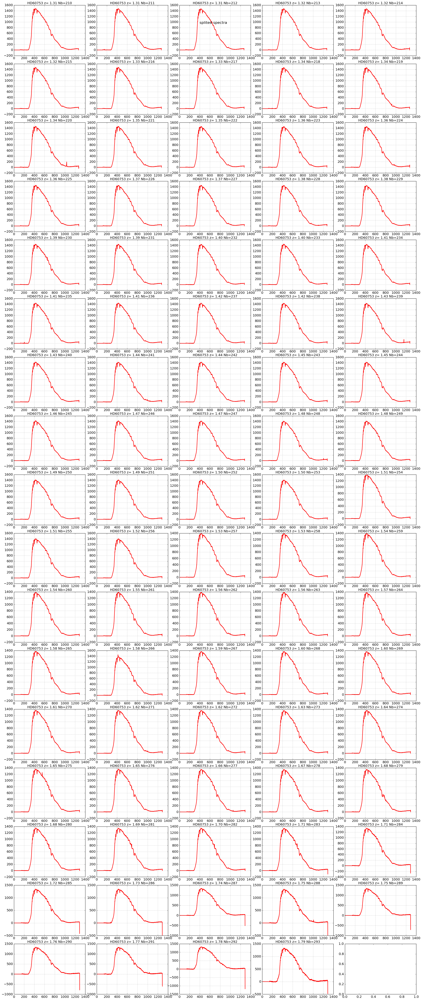

In [45]:
ShowSpectra(all_rightspectra,all_titles,object_name,dir_top_images,'rightspectra.pdf')

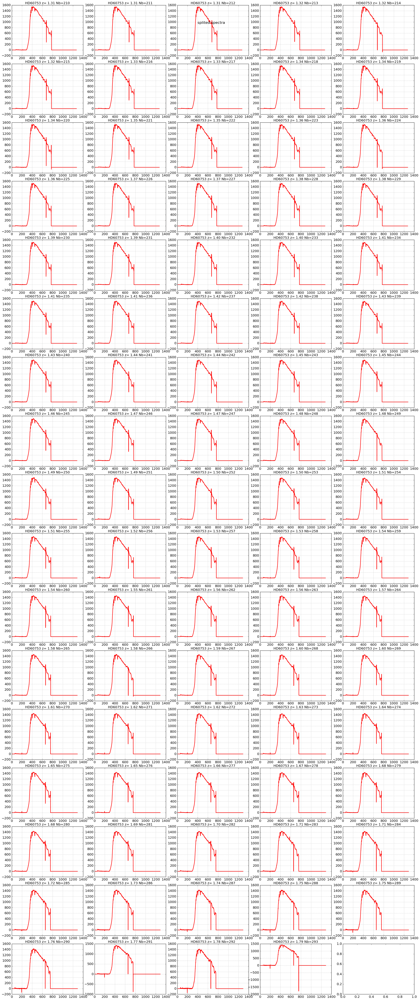

In [46]:
ShowSpectra(all_leftspectra,all_titles,object_name,dir_top_images,'leftspectra.pdf')

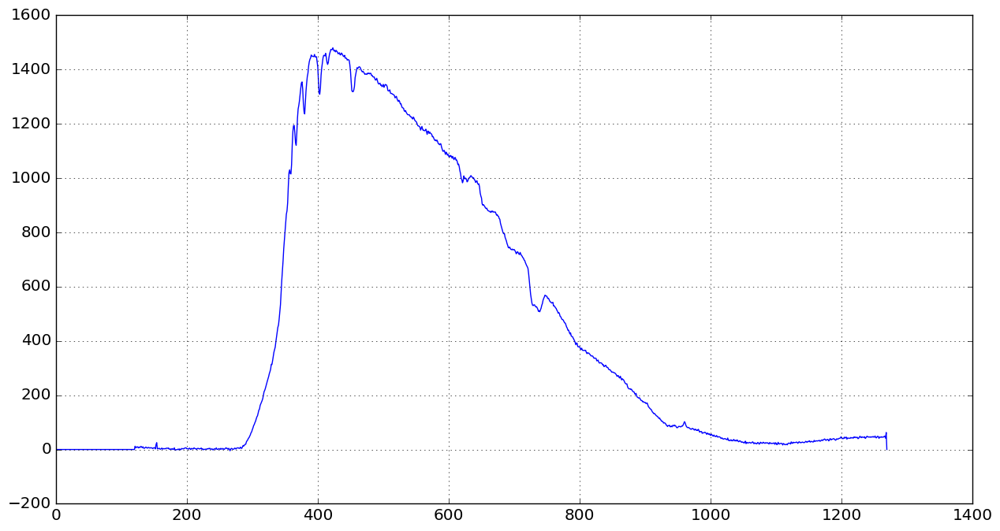

In [47]:
plt.figure(figsize=(15,8))
plt.plot(all_rightspectra[1])
#plt.xlim(0,500)
plt.grid(True)

## Read the simulated spectra

In [48]:
inputsim_filelist=os.listdir(simspecdir) 

In [49]:
if '.DS_Store' in inputsim_filelist:
    inputsim_filelist.remove('.DS_Store')
inputsim_filelist=np.array(inputsim_filelist)

In [50]:
print inputsim_filelist[0:5]

['RT_CT_pp_us_sa_rt_HD60753_Nev210_y2016_m01_aver_spectra.fits'
 'RT_CT_pp_us_sa_rt_HD60753_Nev211_y2016_m01_aver_spectra.fits'
 'RT_CT_pp_us_sa_rt_HD60753_Nev212_y2016_m01_aver_spectra.fits'
 'RT_CT_pp_us_sa_rt_HD60753_Nev213_y2016_m01_aver_spectra.fits'
 'RT_CT_pp_us_sa_rt_HD60753_Nev214_y2016_m01_aver_spectra.fits']


In [51]:
print re.findall('^RT_CT_pp_us_sa_rt_HD60753_Nev(.*)_y2016_m01_aver_spectra.fits',inputsim_filelist[0])

['210']


In [52]:
indexes_simfiles= [] # global list
filelist_simfitspec= []  # global list

In [53]:
#%%cython

import numpy as np
import re

def MakeSimFileList(inputdir,input_filelist):
    """
    MakeFileList : Make The List of files to open
    =============
    """
    
#    import numpy as np
#    import re
    indexes_files= [] # global list
    filelist_fitsimages= []  # global list
    index=0

    
    for file in input_filelist: # loop on directories, one per image       
            filename=inputdir+'/'+file
            if re.search('.*fits$',filename):  #example of filename filter
                index=index+1
                filelist_fitsimages.append(filename)
                str_num=re.findall('^RT_CT_pp_us_sa_rt_HD60753_Nev(.*)_y2016_m01_aver_spectra.fits',file)
                number=int(str_num[0])
                indexes_files.append(number)
    return indexes_files, filelist_fitsimages

In [54]:
indexes_simfiles, filelist_simfitspec=MakeSimFileList(simspecdir,inputsim_filelist)   # filter to take only fits file

In [55]:
# transform into numpy arrays
indexes_simfiles=np.array(indexes_simfiles)
filelist_simfitspec=np.array(filelist_simfitspec)

In [56]:
print indexes_simfiles

[210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227
 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245
 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263
 264 265 266 267 268 269 270 271 272 273 274 275 276 277 278 279 280 281
 282 283 284 285 286 287 288 289 290 291 292 293]


In [57]:
sorted_simindexes=np.argsort(indexes_simfiles) # sort the file indexes

In [58]:
sorted_simindexes

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83])

In [59]:
sorted_simnumbers=indexes_simfiles[sorted_simindexes] # check the ordering with argsort is correct

In [60]:
print sorted_simnumbers # check

[210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227
 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245
 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263
 264 265 266 267 268 269 270 271 272 273 274 275 276 277 278 279 280 281
 282 283 284 285 286 287 288 289 290 291 292 293]


In [61]:
sorted_simfiles=filelist_simfitspec[sorted_simindexes] # now sort the filenames

In [62]:
print sorted_simfiles[0:5] # check

[ '/Users/dagoret-campagnesylvie/MacOsX/LSST/MyWork/GitHub/CTIOAna2017/simu_spectra/fits/HD60753/2017_01_17/210_293/RT_CT_pp_us_sa_rt_HD60753_Nev210_y2016_m01_aver_spectra.fits'
 '/Users/dagoret-campagnesylvie/MacOsX/LSST/MyWork/GitHub/CTIOAna2017/simu_spectra/fits/HD60753/2017_01_17/210_293/RT_CT_pp_us_sa_rt_HD60753_Nev211_y2016_m01_aver_spectra.fits'
 '/Users/dagoret-campagnesylvie/MacOsX/LSST/MyWork/GitHub/CTIOAna2017/simu_spectra/fits/HD60753/2017_01_17/210_293/RT_CT_pp_us_sa_rt_HD60753_Nev212_y2016_m01_aver_spectra.fits'
 '/Users/dagoret-campagnesylvie/MacOsX/LSST/MyWork/GitHub/CTIOAna2017/simu_spectra/fits/HD60753/2017_01_17/210_293/RT_CT_pp_us_sa_rt_HD60753_Nev213_y2016_m01_aver_spectra.fits'
 '/Users/dagoret-campagnesylvie/MacOsX/LSST/MyWork/GitHub/CTIOAna2017/simu_spectra/fits/HD60753/2017_01_17/210_293/RT_CT_pp_us_sa_rt_HD60753_Nev214_y2016_m01_aver_spectra.fits']


In [63]:
hdu_list=fits.open(sorted_simfiles[49])
header=hdu_list[0].header

In [64]:
print header

SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                    8 / array data type                                NAXIS   =                    0 / number of array dimensions                     EXTEND  =                    T                                                  OBJ_NAME= 'HD60753 '                                                            AIRMASS =    1.539000034332275                                                  UNITS   = 'wavelength in nm'                                                    DATE    = '2017-01-18T08:31:40.607'                                             EXPOSURE=                 30.0                                                  FILENAME= 'trim_20170117_259.fits'                                              COMMENT Prediction of observable SPECTRA                                        END                                                                                                                     

In [65]:
 table_data=hdu_list[1].data

In [66]:
print table_data.columns

ColDefs(
    name = 'WAVELENGTH'; format = 'E'
    name = 'SEDcalspec'; format = 'E'
    name = 'Atmosphere'; format = 'E'
    name = 'QE'; format = 'E'
    name = 'SEDxQExATM'; format = 'E'
)


In [67]:
simwavelength = table_data.field('WAVELENGTH')
simsed        = table_data.field('SEDcalspec')
simatm        = table_data.field('Atmosphere')
simqe         = table_data.field('QE')
simspectra    = table_data.field('SEDxQExATM')

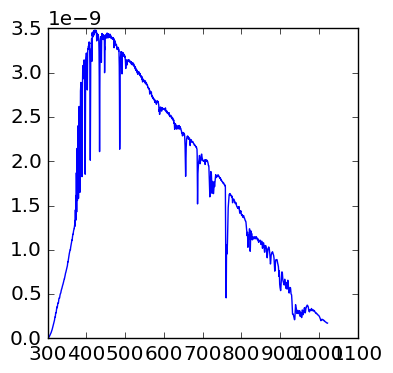

In [68]:
plt.plot(simwavelength,simspectra )

In [69]:
#%%cython

#import numpy as np
#from astropy.io import fits
def BuildSimSpec(sorted_filenames,sorted_numbers,object_name):
    """
    BuildSimSpec
    ===============
    """

    all_dates = []
    all_airmass = []
    
    all_simwavelength = []
    all_simspectra = []
    all_simatmosphere = []
    all_simqe = []
    all_simsed = []
    
    all_titles = []
    all_header = []
    all_expo = []
   
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        print idx
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        header=hdu_list[0].header
                
        #print header
        date_obs = header['DATE']
        airmass = header['AIRMASS']
        expo = header['EXPOSURE']
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        
        # now reads the spectra
        
        table_data=hdu_list[1].data
        
        simwavelength = table_data.field('WAVELENGTH')
        simsed        = table_data.field('SEDcalspec')
        simatm        = table_data.field('Atmosphere')
        simqe         = table_data.field('QE')
        simspectra    = table_data.field('SEDxQExATM')
        
        
        all_simwavelength.append(simwavelength)
        all_simspectra.append(simspectra)
        all_simatmosphere.append(simatm)
        all_simqe.append(simqe)
        all_simsed.append(simsed)
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
            
        all_titles.append(title)
        all_header.append(header)
        all_expo.append(expo)
        hdu_list.close()
        
    return all_dates,all_airmass,all_titles,all_header,all_expo,all_simwavelength,all_simspectra,all_simatmosphere,all_simqe,all_simsed

In [70]:
# crash because it blows up fits IO capability : too many files open
#all_simdates,all_simairmass,all_simtitles,all_simheader,all_simexpo,all_simwavelength,all_simspectra,all_simatmosphere,all_simqe,all_simsed=BuildSimSpec(sorted_simfiles,sorted_simnumbers,object_name)

In [71]:
# better open a singel file produced by view_SimSpectrum

hdu_list=fits.open(simspectrasummary)
header=hdu_list[0].header
print header

simspectra_data=hdu_list[0].data

SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                 1894                                                  NAXIS2  =                   85                                                  EXTEND  =                    T                                                  END                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

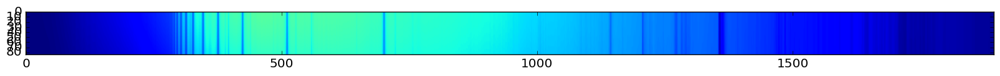

In [72]:
plt.figure(figsize=(20,20))
plt.imshow(simspectra_data[:,:],vmin=0,vmax=8e-9)

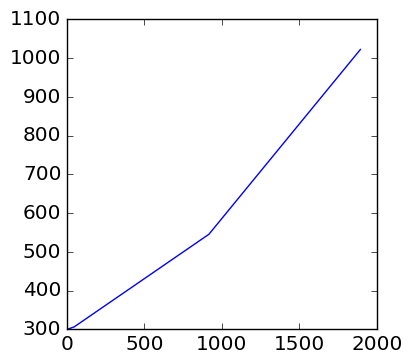

In [73]:
plt.plot(simspectra_data[0,:])

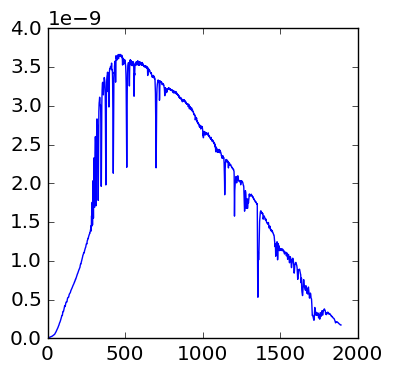

In [74]:
plt.plot(simspectra_data[2,:])

In [75]:
wl_O2Aline=759.37
wl_O2Bline=686.719
wl_Haline=656.281 
wl_Hbline=486.134
wl_Hgline=434.047 
wl_Hdline=410.175

#wl_Naline=589.592+1
#wl_Heline=587.5618-1


#wl_Hgline=546.073
#wl_Feline=527.039
wl_calib= np.array([wl_O2Aline, wl_Haline, wl_Hbline, wl_Hgline,wl_Hdline ])

## Comparison of spectra

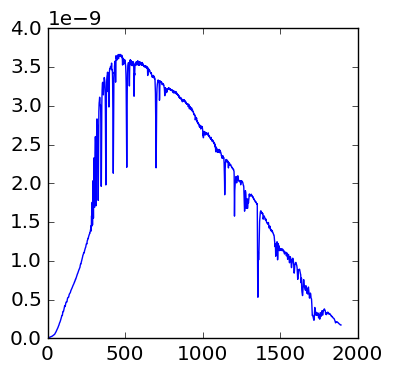

In [76]:
plt.plot(simspectra_data[2,:])

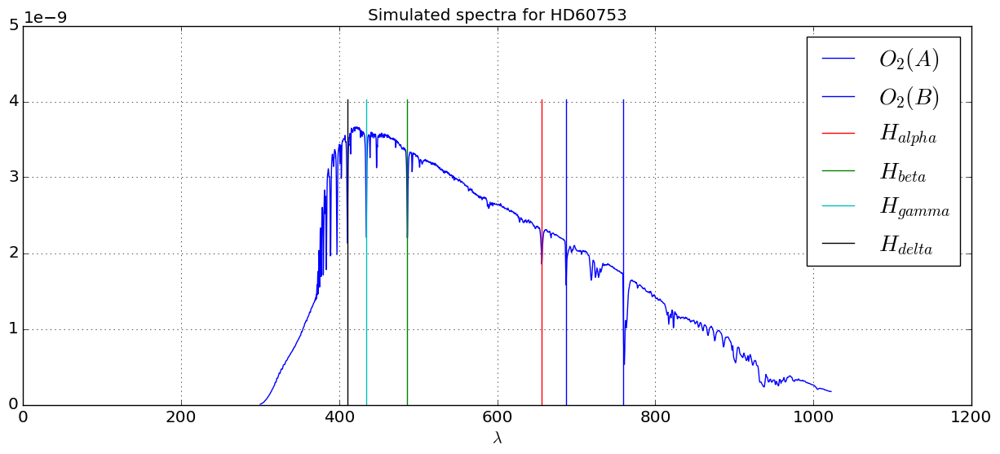

In [116]:
ymax=simspectra_data[2,:].max()*1.1
ymin=simspectra_data[2,:].min()
plt.figure(figsize=(15,6))
plt.plot(simspectra_data[0,:],simspectra_data[2,:])

plt.plot([wl_O2Aline,wl_O2Aline],[ymin,ymax],'b-',label='$O_2(A)$',lw=1)
plt.plot([wl_O2Bline,wl_O2Bline],[ymin,ymax],'b-',label='$O_2(B)$',lw=1)
plt.plot([wl_Haline,wl_Haline],[ymin,ymax],'r-',label='$H_{alpha}$',lw=1)
plt.plot([wl_Hbline,wl_Hbline],[ymin,ymax],'g-',label='$H_{beta}$',lw=1)
plt.plot([wl_Hgline,wl_Hgline],[ymin,ymax],'c-',label='$H_{gamma}$',lw=1)
plt.plot([wl_Hdline,wl_Hdline],[ymin,ymax],'k-',label='$H_{delta}$',lw=1)

plt.legend(loc='best',fontsize=20)
plt.ylim(0.,0.5e-8)
plt.xlim(0,1200)
plt.xlabel("$\lambda$")
title = 'Simulated spectra for {}'.format(object_name)
plt.title(title)
plt.grid(True)
figfilename=os.path.join(dir_top_images,'simspectra_sample.pdf')
plt.savefig(figfilename)

# define the range where to search the minimum

In [78]:
pixminO2=720
pixmaxO2=750

pixminHa=610
pixmaxHa=630

pixminHb=440
pixmaxHb=460

pixminHg=395
pixmaxHg=410

pixminHd=374
pixmaxHd=382

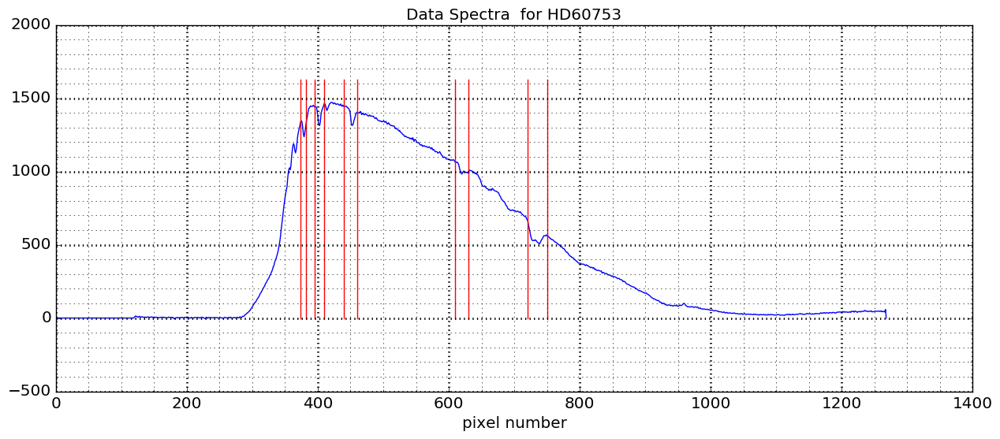

In [79]:
ymax=all_rightspectra[1].max()*1.1
ymin=0

fig, ax = plt.subplots(1, 1, figsize=(15,6))
ax.plot(all_rightspectra[2])
#ax.set_xlim(0,500)

ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.grid(b=True, which='major', color='k', linewidth=2.0)
ax.grid(b=True, which='minor', color='k', linewidth=0.5)
# O2 boundary
ax.plot([pixminO2,pixminO2],[ymin,ymax],'r-')
ax.plot([pixmaxO2,pixmaxO2],[ymin,ymax],'r-')

ax.plot([pixminHa,pixminHa],[ymin,ymax],'r-')
ax.plot([pixmaxHa,pixmaxHa],[ymin,ymax],'r-')

ax.plot([pixminHb,pixminHb],[ymin,ymax],'r-')
ax.plot([pixmaxHb,pixmaxHb],[ymin,ymax],'r-')

ax.plot([pixminHg,pixminHg],[ymin,ymax],'r-')
ax.plot([pixmaxHg,pixmaxHg],[ymin,ymax],'r-')

ax.plot([pixminHd,pixminHd],[ymin,ymax],'r-')
ax.plot([pixmaxHd,pixmaxHd],[ymin,ymax],'r-')

title = 'Data Spectra  for {}'.format(object_name)
plt.title(title)
plt.xlabel('pixel number')
figfilename=os.path.join(dir_top_images,'lineselectionregions_right_sample.pdf')
plt.savefig(figfilename)

In [80]:
def FindO2line(spectrum):
    peak_O2=np.min(spectrum[pixminO2:pixmaxO2])
    indexes_O2=np.where(spectrum==peak_O2)
    theO2index=np.where(np.logical_and(np.greater(indexes_O2,pixminO2), np.less(indexes_O2,pixmaxO2)), indexes_O2,0)
    return theO2index, peak_O2

In [81]:
def FindHaline(spectrum):
    peak_Ha=np.min(spectrum[pixminHa:pixmaxHa])
    indexes_Ha=np.where(spectrum==peak_Ha)
    theHaindex=np.where(np.logical_and(np.greater(indexes_Ha,pixminHa), np.less(indexes_Ha,pixmaxHa)), indexes_Ha,0)
    return theHaindex, peak_Ha

In [82]:
def FindHbline(spectrum):
    peak_Hb=np.min(spectrum[pixminHb:pixmaxHb])
    indexes_Hb=np.where(spectrum==peak_Hb)
    theHbindex=np.where(np.logical_and(np.greater(indexes_Hb,pixminHb), np.less(indexes_Hb,pixmaxHb)), indexes_Hb,0)
    return theHbindex, peak_Hb

In [83]:
def FindHgline(spectrum):
    peak_Hg=np.min(spectrum[pixminHg:pixmaxHg])
    indexes_Hg=np.where(spectrum==peak_Hg)
    theHgindex=np.where(np.logical_and(np.greater(indexes_Hg,pixminHg), np.less(indexes_Hg,pixmaxHg)), indexes_Hg,0)
    return theHgindex, peak_Hg

In [84]:
def FindHdline(spectrum):
    peak_Hd=np.min(spectrum[pixminHd:pixmaxHd])
    indexes_Hd=np.where(spectrum==peak_Hd)
    theHdindex=np.where(np.logical_and(np.greater(indexes_Hd,pixminHd), np.less(indexes_Hd,pixmaxHd)), indexes_Hd,0)
    return theHdindex, peak_Hd

In [85]:
theO2index, peak_O2=FindO2line(all_rightspectra[1])
theHaindex, peak_Ha=FindHaline(all_rightspectra[1])
theHbindex, peak_Hb=FindHbline(all_rightspectra[1])
theHgindex, peak_Hg=FindHgline(all_rightspectra[1])
theHdindex, peak_Hd=FindHdline(all_rightspectra[1])

In [86]:
print  theO2index,theHaindex, theHbindex,theHgindex,theHdindex

[[739]] [[621]] [[454]] [[403]] [[380]]


In [87]:
def FindLines(spec):
    indexO2,peak_O2=FindO2line(spec)
    indexHa,peakHa=FindHaline(spec)
    indexHb,peakHb=FindHbline(spec)
    indexHg,peakHg=FindHgline(spec)
    indexHd,peakHd=FindHdline(spec)
    return indexO2[0][0],indexHa[0][0],indexHb[0][0],indexHg[0][0],indexHd[0][0]

In [88]:
lpix=FindLines(all_rightspectra[1])

In [89]:

YY= np.array([wl_O2Aline,wl_Haline,wl_Hbline,wl_Hgline,wl_Hdline])
XX=np.array([np.array(lpix)]).flatten()

In [90]:
YY

array([ 759.37 ,  656.281,  486.134,  434.047,  410.175])

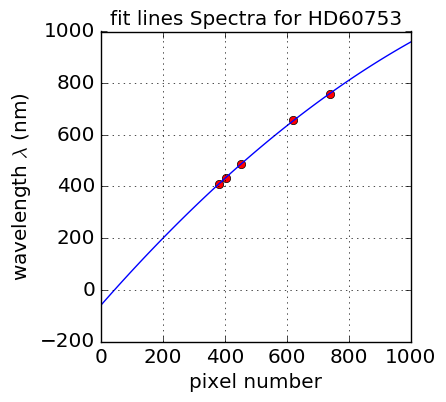

In [91]:
plt.plot(XX,YY,'ro')
z =  np.polyfit(XX,YY, FIT_ORDER)
fitcurve = np.poly1d(z)
x_fit=np.linspace(0,1000,100)
y_fit=fitcurve(x_fit)
plt.plot(x_fit,y_fit,'b-')
#plt.xlim(0,500)
#plt.ylim(0,1100)
plt.grid(True)
title = 'fit lines Spectra for {}'.format(object_name)
plt.title(title)
plt.xlabel('pixel number')
plt.ylabel('wavelength $\lambda$ (nm)')
figfilename=os.path.join(dir_top_images,'lineselectionregions_sample.pdf')
plt.savefig(figfilename)

## Find Absorption lines
==================================

In [92]:
#%%cython
#import numpy as np
#import matplotlib.pyplot as plt
#import matplotlib as mpl    
def FindAllAbsorptionLines(all_spectra,all_titles,object_name,figname):
    """
    FindAbsorptionLines: Show the raw images without background subtraction
    ==============
    """
    NBABSLINES=5
    NBSPECTRA=len(all_spectra)
    MAXIMGROW=int(NBSPECTRA/5)+1
    
    all_absorptionline_pix=np.zeros((NBSPECTRA,NBABSLINES))
    
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(25,60))
    f.tight_layout()

    for index in np.arange(0,NBSPECTRA):
        ix=index%5
        iy=index/5
        spectrum=all_spectra[index]
        
        ymax=spectrum.max()*1.1
        ymin=0
        
        axarr[iy,ix].plot(spectrum,'b-',lw=2)
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].set_ylim(ymin,ymax)
        #axarr[iy,ix].set_xlim(0.,500.)
        axarr[iy,ix].grid(True)

        axarr[iy,ix].get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].grid(b=True, which='major', color='k', linewidth=2.0)
        axarr[iy,ix].grid(b=True, which='minor', color='k', linewidth=0.5)
        # O2 boundary
        axarr[iy,ix].plot([pixminO2,pixminO2],[ymin,ymax],'r-')
        axarr[iy,ix].plot([pixmaxO2,pixmaxO2],[ymin,ymax],'r-')

        axarr[iy,ix].plot([pixminHa,pixminHa],[ymin,ymax],'r-')
        axarr[iy,ix].plot([pixmaxHa,pixmaxHa],[ymin,ymax],'r-')

        axarr[iy,ix].plot([pixminHb,pixminHb],[ymin,ymax],'r-')
        axarr[iy,ix].plot([pixmaxHb,pixmaxHb],[ymin,ymax],'r-')

        axarr[iy,ix].plot([pixminHg,pixminHg],[ymin,ymax],'r-')
        axarr[iy,ix].plot([pixmaxHg,pixmaxHg],[ymin,ymax],'r-')
        
        axarr[iy,ix].plot([pixminHd,pixminHd],[ymin,ymax],'r-')
        axarr[iy,ix].plot([pixmaxHd,pixmaxHd],[ymin,ymax],'r-')

        absorptionlines_pix=FindLines(spectrum)
        all_absorptionline_pix[index,:]=absorptionlines_pix
        
        figfilename=os.path.join(dir_top_images,figname)
        plt.savefig(figfilename)
    
    return all_absorptionline_pix 

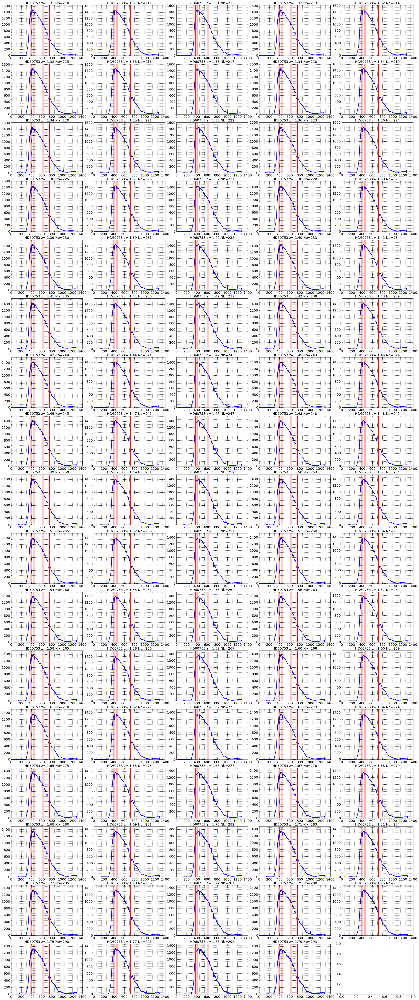

In [93]:
all_absorptionline_pix_right=FindAllAbsorptionLines(all_rightspectra,all_titles,object_name,'lineselectionregionsleft.pdf')

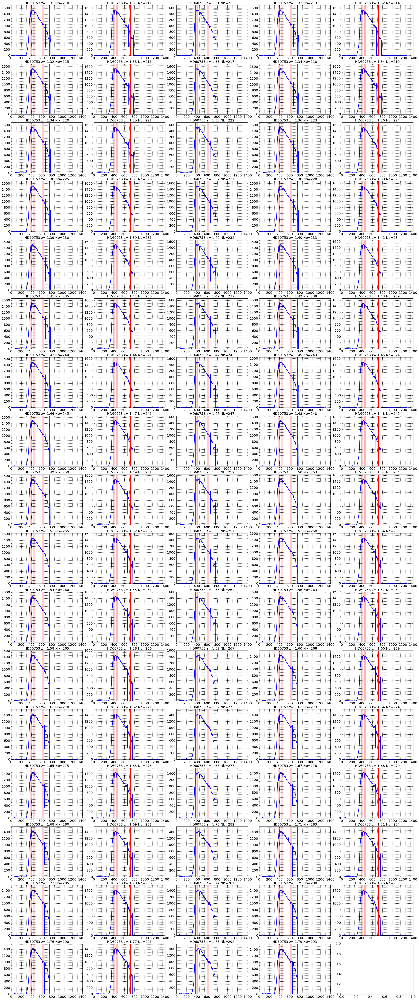

In [94]:
all_absorptionline_pix_left=FindAllAbsorptionLines(all_leftspectra,all_titles,object_name,'lineselectionregionsright.pdf')

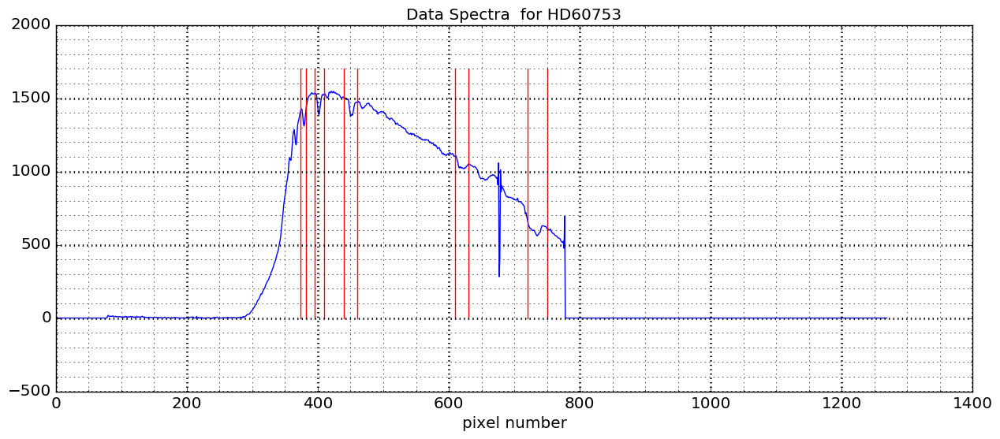

In [95]:
ymax=all_leftspectra[1].max()*1.1
ymin=0

fig, ax = plt.subplots(1, 1, figsize=(15,6))
ax.plot(all_leftspectra[1])
#ax.set_xlim(0,500)

ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.grid(b=True, which='major', color='k', linewidth=2.0)
ax.grid(b=True, which='minor', color='k', linewidth=0.5)
# O2 boundary
ax.plot([pixminO2,pixminO2],[ymin,ymax],'r-')
ax.plot([pixmaxO2,pixmaxO2],[ymin,ymax],'r-')

ax.plot([pixminHa,pixminHa],[ymin,ymax],'r-')
ax.plot([pixmaxHa,pixmaxHa],[ymin,ymax],'r-')

ax.plot([pixminHb,pixminHb],[ymin,ymax],'r-')
ax.plot([pixmaxHb,pixmaxHb],[ymin,ymax],'r-')

ax.plot([pixminHg,pixminHg],[ymin,ymax],'r-')
ax.plot([pixmaxHg,pixmaxHg],[ymin,ymax],'r-')

ax.plot([pixminHd,pixminHd],[ymin,ymax],'r-')
ax.plot([pixmaxHd,pixmaxHd],[ymin,ymax],'r-')

title = 'Data Spectra  for {}'.format(object_name)
plt.title(title)
plt.xlabel('pixel number')

figfilename=os.path.join(dir_top_images,'lineselectionregions_left_sample.pdf')
plt.savefig(figfilename)

## Does the fit 1D with order FIT_ORDER
==================================================

In [96]:

#print all_absorptionline_pix_right

In [97]:
#%%cython
#import numpy as np
#import matplotlib.pyplot as plt
#import matplotlib as mpl    
def FitCalibrationCurve(all_absorptionline_pix ,wl_calib, all_titles,object_name,figname):
    """
    FitCalibrationCurve: Show the camibration curve
    ==============
    """
    NBABSLINES=5
    NBSPECTRA=all_absorptionline_pix.shape[0]
    MAXIMGROW=int(NBSPECTRA/5)+1
    
    #FIT_ORDER=2
    
    FitResults=np.zeros((NBSPECTRA,FIT_ORDER+1)) # for a polynom of order 1
    
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(25,60))
    f.tight_layout()

    for index in np.arange(0,NBSPECTRA):
        ix=index%5
        iy=index/5
        
        
        x=all_absorptionline_pix[index,:]
        y=wl_calib
        
        goodindexes = np.where(x!=0)
        
        x_new=x[goodindexes]
        y_new=y[goodindexes]
        
        z =  np.polyfit(x_new, y_new, FIT_ORDER)

        fitcurve = np.poly1d(z)
        x_fit=np.linspace(0,1000,100)
        y_fit=fitcurve(x_fit)
        
        FitResults[index,:]=z
        
        axarr[iy,ix].plot(x_new,y_new,'ro',lw=2)
        axarr[iy,ix].plot(x_fit,y_fit,'b-',lw=2)
        axarr[iy,ix].set_title(all_titles[index])
        
        #axarr[iy,ix].set_xlim(0.,500.)
        #axarr[iy,ix].set_ylim(0.,1000.)
        axarr[iy,ix].grid(True)

        axarr[iy,ix].get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].grid(b=True, which='major', color='k', linewidth=2.0)
        axarr[iy,ix].grid(b=True, which='minor', color='k', linewidth=0.5)
        
        figfilename=os.path.join(dir_top_images,figname)
        plt.savefig(figfilename)
        
    return FitResults
       

In [98]:
#%%cython
#import numpy as np
#import matplotlib.pyplot as plt
#import matplotlib as mpl    
def FitCalibrationCurve2(all_absorptionline_pix ,wl_calib, all_titles,object_name,figname):
    """
    FitCalibrationCurve2: Show the camibration curve
    ==============
    """
    NBABSLINES=5
    NBSPECTRA=all_absorptionline_pix.shape[0]
    MAXIMGROW=int(NBSPECTRA/5)+1
    #FIT_ORDER=2
    
    FitResults=np.zeros((NBSPECTRA,FIT_ORDER+1)) # for a polynom of order 2
    
    fig, ax = plt.subplots(1, 1, figsize=(10,10))

    for index in np.arange(0,NBSPECTRA):
        ix=index%5
        iy=index/5
        
               
        x=all_absorptionline_pix[index,:]
        y=wl_calib
        
        goodindexes = np.where(x!=0)
        
        x_new=x[goodindexes]
        y_new=y[goodindexes]
        
        z =  np.polyfit(x_new, y_new, FIT_ORDER)
        print 'z = ',z
        fitcurve = np.poly1d(z)
        x_fit=np.linspace(0,1000,100)
        y_fit=fitcurve(x_fit)
        
        FitResults[index,:]=z

        ax.plot(x_new,y_new,'o',lw=2)
        ax.plot(x_fit,y_fit,'-',lw=2)
       
        
    #ax.set_xlim(0.,500.)
    #ax.set_ylim(0.,1000.)

    ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='k', linewidth=0.5)
    
    title='Fitted Calibration straight lines for object {}'.format(object_name)
    
    ax.set_title(title)
    ax.set_xlabel("pixel number")
    ax.set_ylabel("$\lambda$ (nm)")
    
    figfilename=os.path.join(dir_top_images,figname)
    plt.savefig(figfilename)
    
    return FitResults
       

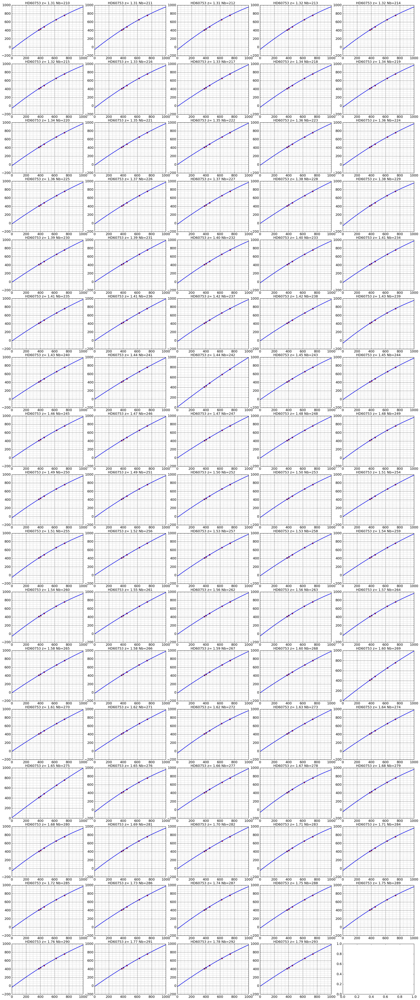

In [99]:
fit_res_right=FitCalibrationCurve(all_absorptionline_pix_right ,wl_calib, all_titles,object_name,'linefitsright.pdf')

z =  [ -3.22797530e-04   1.33807332e+00  -5.17100266e+01]
z =  [ -3.46535914e-04   1.36610911e+00  -6.02284841e+01]
z =  [ -3.63322580e-04   1.38335864e+00  -6.31203844e+01]
z =  [ -3.28673067e-04   1.34950534e+00  -5.62097000e+01]
z =  [ -3.40012759e-04   1.35591649e+00  -5.71764874e+01]
z =  [ -3.46149855e-04   1.36694488e+00  -6.03923965e+01]
z =  [ -3.15759318e-04   1.32919755e+00  -5.01151286e+01]
z =  [ -2.02520609e-04   1.20078081e+00  -1.57319849e+01]
z =  [ -2.75356172e-04   1.28339896e+00  -3.74023656e+01]
z =  [ -2.68245757e-04   1.27379092e+00  -3.44498343e+01]
z =  [ -2.50336186e-04   1.25591021e+00  -3.01631539e+01]
z =  [ -2.20791686e-04   1.21904266e+00  -2.01133559e+01]
z =  [ -1.61248513e-04   1.15276374e+00  -3.69497132e+00]
z =  [ -2.20791686e-04   1.21904266e+00  -2.01133559e+01]
z =  [ -2.45910724e-04   1.24667380e+00  -2.73939048e+01]
z =  [ -2.15232936e-04   1.21026070e+00  -1.85125481e+01]
z =  [ -2.20791686e-04   1.21948425e+00  -2.13326194e+01]
z =  [ -2.4451

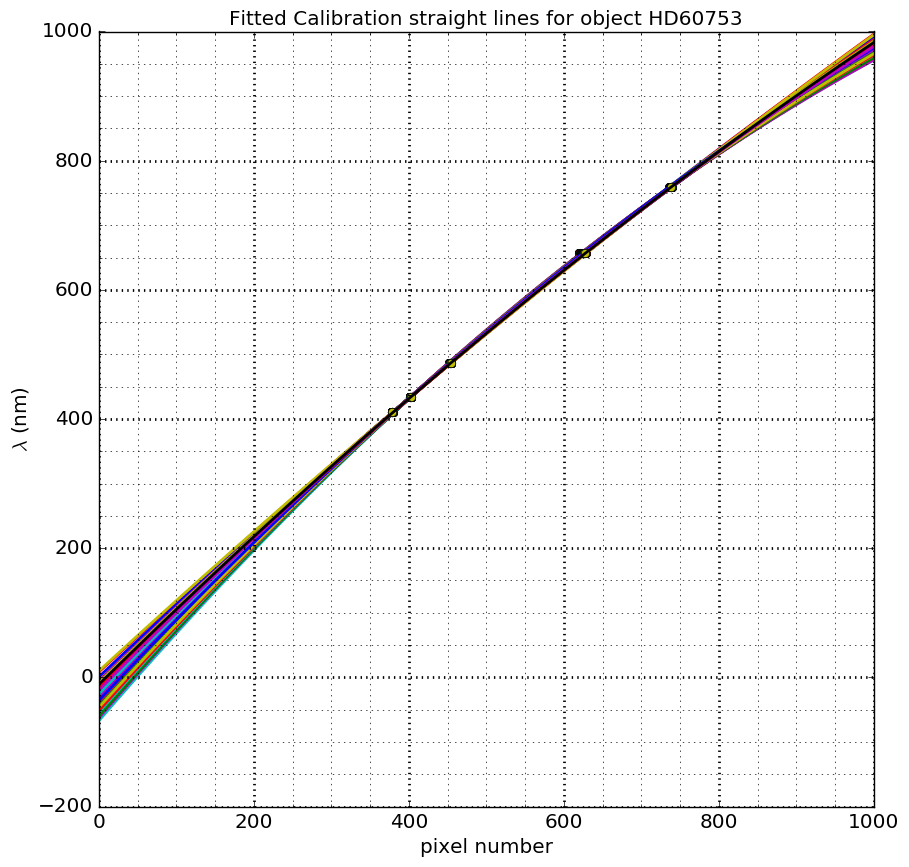

In [100]:
fit_res_right2=FitCalibrationCurve2(all_absorptionline_pix_right ,wl_calib, all_titles,object_name,'linefitsright2.pdf')

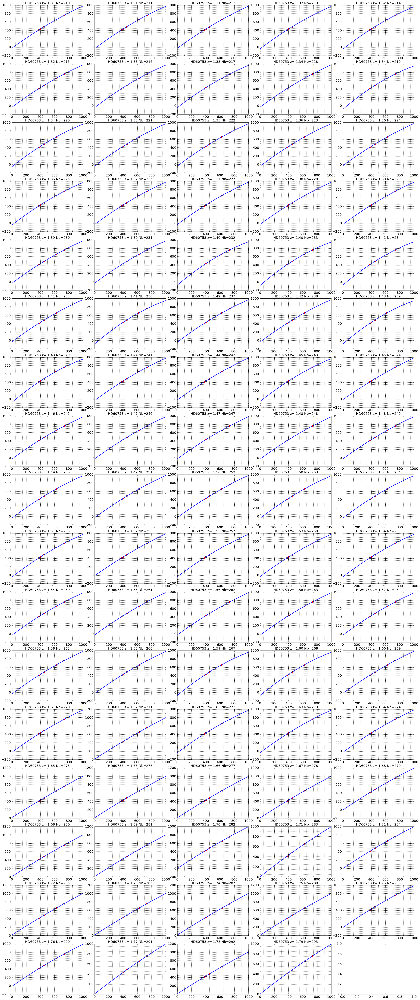

In [101]:
fit_res_left=FitCalibrationCurve(all_absorptionline_pix_left ,wl_calib, all_titles,object_name,'linefitsleft.pdf')

z =  [ -2.30342994e-04   1.23707181e+00  -2.55911905e+01]
z =  [ -2.71181860e-04   1.28261524e+00  -3.70479740e+01]
z =  [ -2.30342994e-04   1.23753250e+00  -2.68284926e+01]
z =  [ -2.80366331e-04   1.29327454e+00  -4.03328785e+01]
z =  [ -3.17092364e-04   1.33170519e+00  -4.94542839e+01]
z =  [ -2.62204950e-04   1.27517229e+00  -3.59980762e+01]
z =  [ -2.98526649e-04   1.31439881e+00  -4.52684755e+01]
z =  [ -3.02251057e-04   1.31239439e+00  -4.46759433e+01]
z =  [ -2.48188194e-04   1.25839030e+00  -3.17192715e+01]
z =  [ -4.25424783e-04   1.46088636e+00  -8.53662854e+01]
z =  [ -3.32913986e-04   1.35044219e+00  -5.50246929e+01]
z =  [ -2.80366331e-04   1.29383528e+00  -4.16264334e+01]
z =  [ -2.80366331e-04   1.29327454e+00  -4.03328785e+01]
z =  [ -2.81467525e-04   1.29678678e+00  -4.22612305e+01]
z =  [ -2.49881378e-04   1.25897267e+00  -3.19188174e+01]
z =  [ -3.04513113e-04   1.32105882e+00  -4.75969427e+01]
z =  [ -2.54696398e-04   1.26509502e+00  -3.29180781e+01]
z =  [ -2.5469

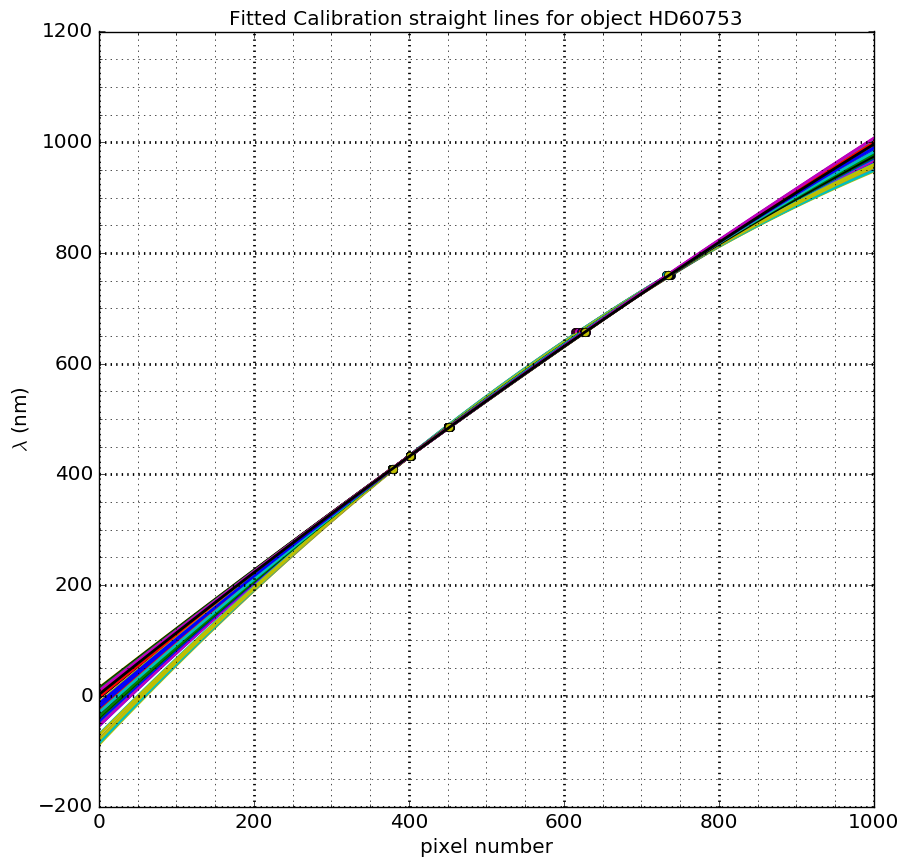

In [102]:
fit_res_left2=FitCalibrationCurve2(all_absorptionline_pix_left ,wl_calib, all_titles,object_name,'linefitsleft2.pdf')

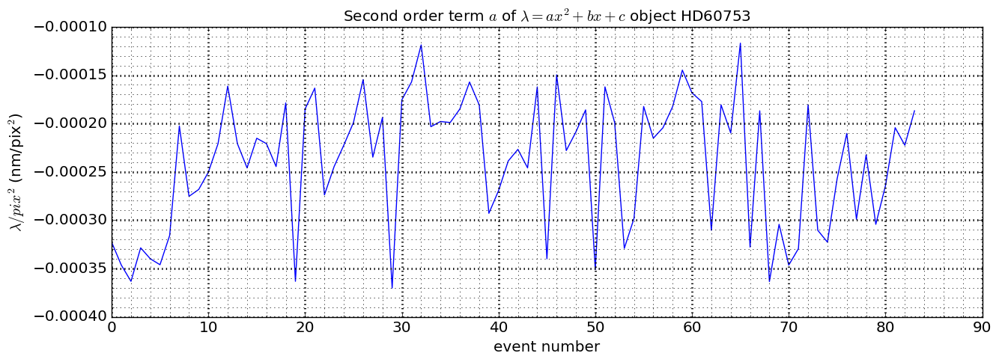

In [103]:
fig, ax = plt.subplots(1, 1, figsize=(15,5))
ax.plot(fit_res_right[:,0])
ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.grid(b=True, which='major', color='k', linewidth=2.0)
ax.grid(b=True, which='minor', color='k', linewidth=0.5)
title='Second order term $a$ of $\lambda = a x^2 + b x +c $ object {}'.format(object_name)
ax.set_title(title)
ax.set_xlabel("event number")
ax.set_ylabel("$\lambda/pix^2$ (nm/pix$^2$)")
figname='a_fit_term_rightspec.pdf'
figfilename=os.path.join(dir_top_images,figname)
plt.savefig(figfilename)

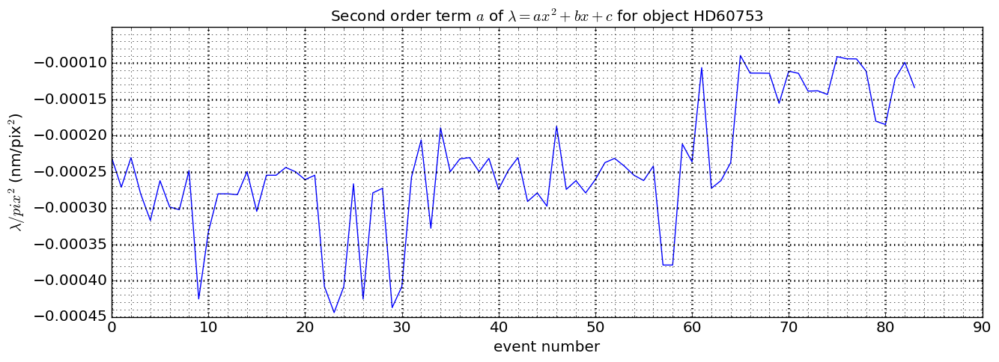

In [104]:
fig, ax = plt.subplots(1, 1, figsize=(15,5))
ax.plot(fit_res_left[:,0])
ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.grid(b=True, which='major', color='k', linewidth=2.0)
ax.grid(b=True, which='minor', color='k', linewidth=0.5)
title='Second order term $a$ of $\lambda = a x^2 + b x +c $ for object {}'.format(object_name)
ax.set_title(title)
ax.set_xlabel("event number")
ax.set_ylabel("$\lambda/pix^2$ (nm/pix$^2$)")
#ax.set_ylim(2.0,2.2)
figname='a_fit_term_leftspec.pdf'
figfilename=os.path.join(dir_top_images,figname)
plt.savefig(figfilename)

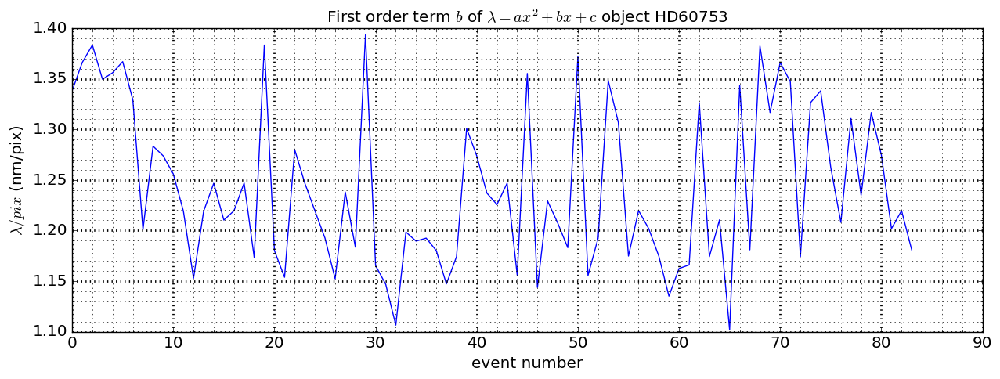

In [105]:
fig, ax = plt.subplots(1, 1, figsize=(15,5))
ax.plot(fit_res_right[:,1])
ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.grid(b=True, which='major', color='k', linewidth=2.0)
ax.grid(b=True, which='minor', color='k', linewidth=0.5)
title='First order term $b$ of $\lambda = a x^2 + b x +c $ object {}'.format(object_name)
ax.set_title(title)
ax.set_xlabel("event number")
ax.set_ylabel("$\lambda/pix$ (nm/pix)")
#ax.set_ylim(0,35)
figname='b_fit_term_rightspec.pdf'
figfilename=os.path.join(dir_top_images,figname)
plt.savefig(figfilename)

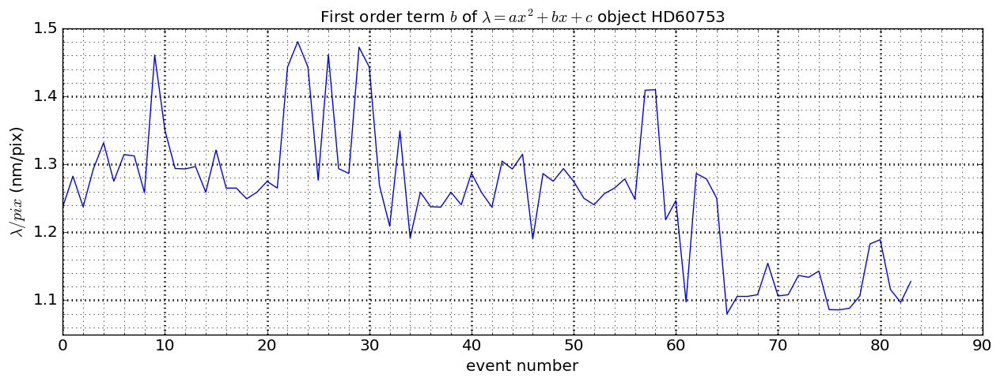

In [106]:
fig, ax = plt.subplots(1, 1, figsize=(15,5))
ax.plot(fit_res_left[:,1])
ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.grid(b=True, which='major', color='k', linewidth=2.0)
ax.grid(b=True, which='minor', color='k', linewidth=0.5)
title='First order term $b$ of $\lambda = a x^2 + b x +c $ object {}'.format(object_name)
ax.set_title(title)
ax.set_xlabel("event number")
ax.set_ylabel("$\lambda/pix $ (nm/pix)")
#ax.set_ylim(0,35)
figname='b_fit_term_leftspec.pdf'
figfilename=os.path.join(dir_top_images,figname)
plt.savefig(figfilename)

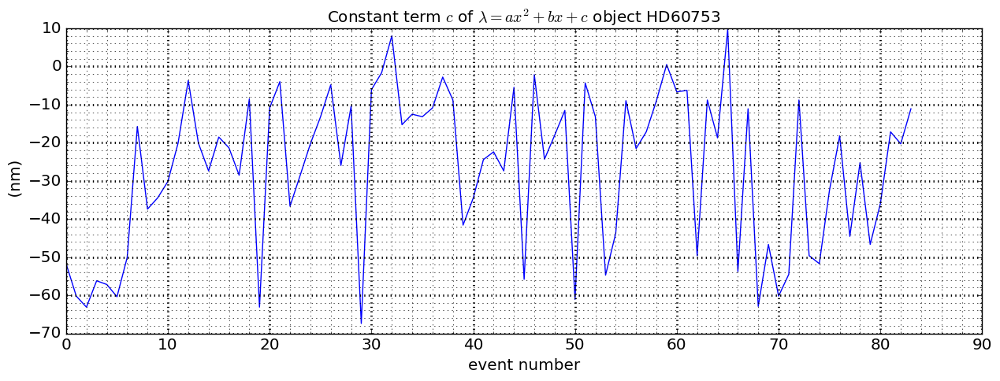

In [107]:
fig, ax = plt.subplots(1, 1, figsize=(15,5))
ax.plot(fit_res_right[:,2])
ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.grid(b=True, which='major', color='k', linewidth=2.0)
ax.grid(b=True, which='minor', color='k', linewidth=0.5)
title='Constant term $c$ of $\lambda = a x^2 + b x +c $ object {}'.format(object_name)
ax.set_title(title)
ax.set_xlabel("event number")
ax.set_ylabel(" (nm)")
#ax.set_ylim(0,35)
figname='c_fit_term_rightspec.pdf'
figfilename=os.path.join(dir_top_images,figname)
plt.savefig(figfilename)

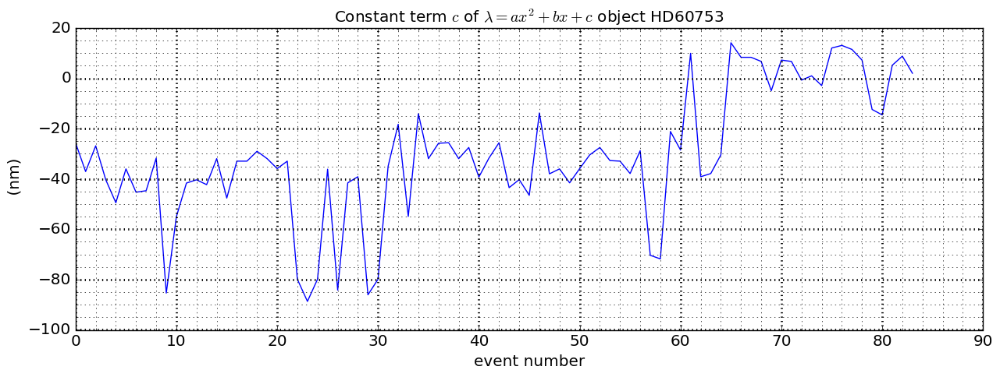

In [108]:
fig, ax = plt.subplots(1, 1, figsize=(15,5))
ax.plot(fit_res_left[:,2])
ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
ax.grid(b=True, which='major', color='k', linewidth=2.0)
ax.grid(b=True, which='minor', color='k', linewidth=0.5)
title='Constant term $c$ of $\lambda = a x^2 + b x +c $ object {}'.format(object_name)
ax.set_title(title)
ax.set_xlabel("event number")
ax.set_ylabel(" (nm)")
#ax.set_ylim(0,35)
figname='c_fit_term_leftspec.pdf'
figfilename=os.path.join(dir_top_images,figname)
plt.savefig(figfilename)

### Save outputfilename
Results of the fits for right and left spectra are saved as images

In [109]:
prihdr = fits.Header()
prihdr['ANALYST'] = 'Sylvie Dagoret-Campagne'
prihdr['COMMENT'] = "Fits straight line on spectra"
prihdr['OBJ-NAME'] = object_name
prihdu = fits.PrimaryHDU(header=prihdr)
hdulist = fits.HDUList([prihdu])

In [110]:
hdu1=fits.ImageHDU(data=fit_res_right)  # save fits results for right spectra
hdu2=fits.ImageHDU(data=fit_res_left)   # save fits results for left spectra

In [111]:
hdulist.append(hdu1)
hdulist.append(hdu2)

In [112]:
hdulist.writeto(simspectracalibresult,clobber=True)

In [113]:
print hdulist.info()

Filename: (No file associated with this HDUList)
No.    Name         Type      Cards   Dimensions   Format
  0  PRIMARY     PrimaryHDU       7   ()      
  1              ImageHDU         7   (3, 84)   float64   
  2              ImageHDU         7   (3, 84)   float64   
None


In [114]:
hdulist.close()